<a href="https://colab.research.google.com/github/faisu6339-glitch/Real_World-Projects/blob/main/Cassava(EfficientNetB0).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
dataset_path = '/content/dataset_sir'

In [ ]:
!pip install -q tensorflow pandas scikit-learn matplotlib

import os
import json
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.models import Model

print("TensorFlow:", tf.__version__)

TensorFlow: 2.20.0


In [ ]:
print("Contents of /content/drive/MyDrive:")
!ls -F "/content/drive/MyDrive/"

Contents of /content/drive/MyDrive:
'Colab Notebooks'/	   'Untitled form.gform'
 dataset_sir/		   'Untitled project.gscript'
 file.pdf		   'Untitled spreadsheet (1).gsheet'
 main_dataset.zip	   'Untitled spreadsheet (2).gsheet'
 Products.gsheet	   'Untitled spreadsheet (3).gsheet'
 Products.pdf		   'Untitled spreadsheet.gsheet'
'Untitled form (1).gform'


In [ ]:
print("Contents of /content/:")
!ls -F "/content/"

Contents of /content/:
best_mobilenetv3small.keras  drive/  sample_data/


In [ ]:
import pandas as pd

In [ ]:
BASE_PATH = '/content/drive/MyDrive/dataset_sir/main_dataset'
TRAIN_CSV = BASE_PATH + "/Train/Train.csv"
TRAIN_DIR = BASE_PATH + "/Train//Train_Images_clean"

TEST_CSV = BASE_PATH + "/Test/Test.csv"
TEST_DIR = BASE_PATH + "/Test/Test_images_clean"

LABEL_JSON = BASE_PATH + "/label_num_to_disease_map.json"

In [ ]:
train_df = pd.read_csv(TRAIN_CSV)
test_df = pd.read_csv(TEST_CSV)

with open(LABEL_JSON, "r") as f:
    label_map = json.load(f)

print("Train data:")
print(train_df.head())

print("Test data:")
print(test_df.head())

print("Label map:")
print(label_map)

print("Train columns:", train_df.columns)
print("Test columns:", test_df.columns)


Train data:
               ID  Labels
0  1758913732.jpg       3
1  1241243048.jpg       0
2  3761100385.jpg       2
3  3055614106.jpg       3
4  2386589588.jpg       4
Test data:
               ID  Labels
0  2595356168.jpg       3
1   794817264.jpg       0
2  4270972443.jpg       4
3  3540803278.jpg       0
4  2142522228.jpg       3
Label map:
{'0': 'CBB', '1': 'CBSD', '2': 'CGM', '3': 'CMD', '4': 'Healthy'}
Train columns: Index(['ID', 'Labels'], dtype='object')
Test columns: Index(['ID', 'Labels'], dtype='object')


#Counts the Total Numbers of Labels

In [ ]:
train_df["Labels"] = train_df["Labels"].astype(int)
test_df["Labels"] = test_df["Labels"].astype(int)

num_classes = len(label_map)

print("Number of classes:", num_classes)
print("Train class count:")
print(train_df["Labels"].value_counts())

Number of classes: 5
Train class count:
Labels
3    800
0    800
2    800
4    800
1    800
Name: count, dtype: int64


#Counts Total numbers of Taining and Test Images

In [ ]:
print("Number of classes:", num_classes)

print("\nTotal images:")
print("Train:", len(train_df))
print("Test:", len(test_df))

print("\nClass distribution (Train):")
print(train_df["Labels"].value_counts())

Number of classes: 5

Total images:
Train: 4000
Test: 1000

Class distribution (Train):
Labels
3    800
0    800
2    800
4    800
1    800
Name: count, dtype: int64


#label mapping

In [ ]:
import json

with open(LABEL_JSON, 'r') as f:
    label_map = json.load(f)

print(label_map)

{'0': 'CBB', '1': 'CBSD', '2': 'CGM', '3': 'CMD', '4': 'Healthy'}


Convert labels → actual names

In [ ]:
for k, v in label_map.items():
    print(f"Label {k} → {v}")



Label 0 → CBB
Label 1 → CBSD
Label 2 → CGM
Label 3 → CMD
Label 4 → Healthy


In [ ]:
counts = train_df["Labels"].value_counts().sort_index()

for label, count in counts.items():
    print(f"{label_map[str(label)]} → {count}")

CBB → 800
CBSD → 800
CGM → 800
CMD → 800
Healthy → 800


In [ ]:
print("Train Class Distribution (from DataFrame):")
counts_from_df = train_df["Labels"].value_counts().sort_index()
for label, count in counts_from_df.items():
    print(f"{label_map[str(label)]} → {count}")

Train Class Distribution (from DataFrame):
CBB → 800
CBSD → 800
CGM → 800
CMD → 800
Healthy → 800


In [ ]:
import os

# Correct folders
train_dir = '/content/drive/MyDrive/dataset_sir/main_dataset/Train/Train_Images_clean'

test_dir = '/content/drive/MyDrive/dataset_sir/main_dataset/Test/Test_images_clean'


# Function to count images
def count_images(folder):

    total = 0

    for root, dirs, files in os.walk(folder):

        images = [
            f for f in files
            if f.lower().endswith(
                ('.png', '.jpg', '.jpeg')
            )
        ]

        total += len(images)

    return total


# Print counts
print("✅ Total Train Clean Images:",
      count_images(train_dir))

print("✅ Total Test Clean Images:",
      count_images(test_dir))

✅ Total Train Clean Images: 4000
✅ Total Test Clean Images: 1000


#Plotting the Barplot to see all the class image

In [ ]:
counts = train_df["Labels"].value_counts().sort_index()
names = [label_map[str(i)] for i in counts.index]
values = counts.values

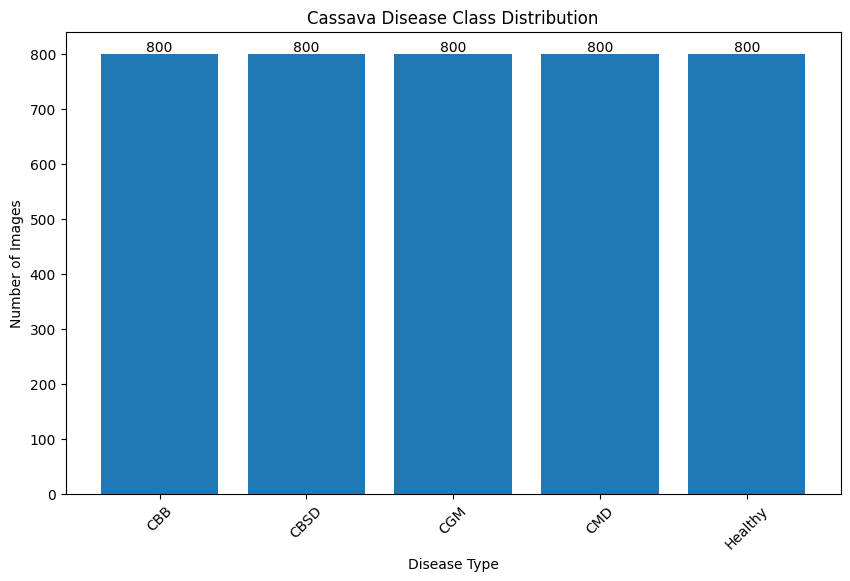

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

plt.bar(names, values)

plt.title("Cassava Disease Class Distribution")
plt.xlabel("Disease Type")
plt.ylabel("Number of Images")

plt.xticks(rotation=45)

# Add values on top
for i, v in enumerate(values):
    plt.text(i, v + 5, str(v), ha='center')

plt.show()

#Function to Access the single images

In [ ]:
print(train_df["Labels"].unique())
print(train_df["Labels"].dtype)

[3 0 2 4 1]
int64


In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

def show_one_image(class_id):
    row = train_df[train_df["Labels"] == class_id].iloc[0]

    img_path = os.path.join(TRAIN_DIR, row["ID"])
    img = Image.open(img_path)

    plt.imshow(img)
    plt.title(label_map[str(class_id)])
    plt.axis("off")
    plt.show()

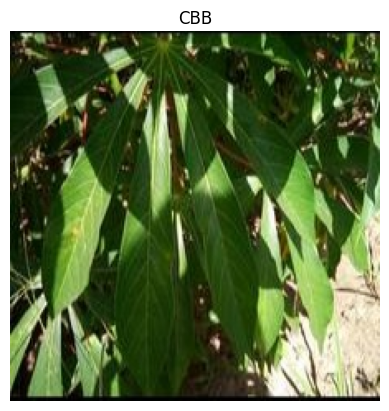

In [ ]:
show_one_image(0)   # change class id

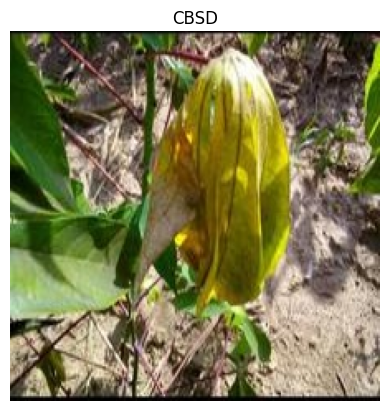

In [ ]:
show_one_image(1)   # change class id

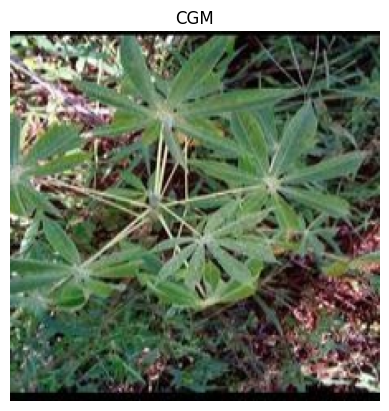

In [ ]:
show_one_image(2)   # change class id

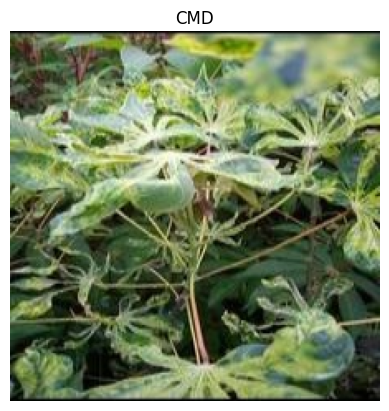

In [ ]:
show_one_image(3)   # change class id

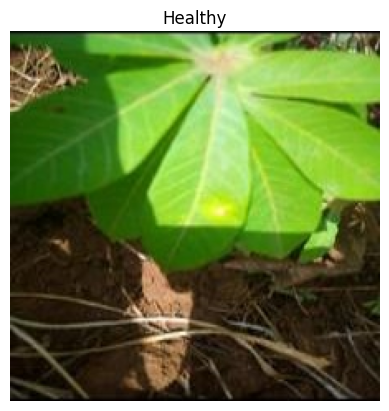

In [ ]:
show_one_image(4)   # change class id

In [ ]:
import cv2
import os

#Function to Access 3 random images from EACH class

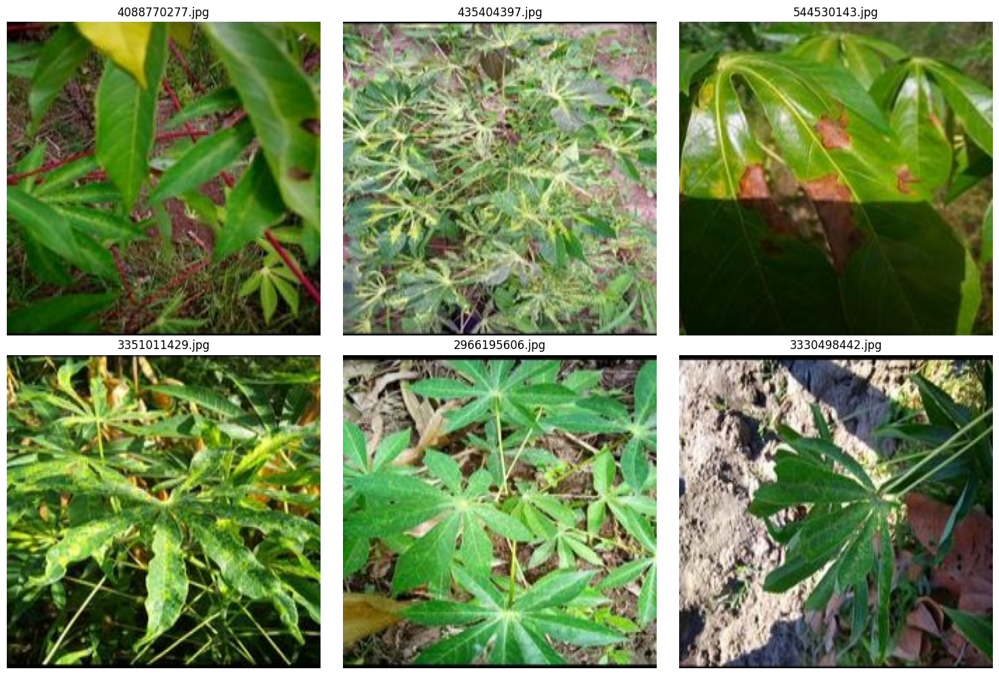

In [ ]:
import matplotlib.pyplot as plt
import os
import cv2
import random

# Folder containing processed images
folder = "/content/drive/MyDrive/dataset_sir/main_dataset/Train/Train_Images_clean"

# Get image files
files = [f for f in os.listdir(folder)
         if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Randomly select 6 images
sample_files = random.sample(files, 6)

# Plot images
plt.figure(figsize=(15,10))

for i, file in enumerate(sample_files):

    img_path = os.path.join(folder, file)

    img = cv2.imread(img_path)

    # Convert BGR → RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 3, i+1)
    plt.imshow(img)
    plt.title(file)
    plt.axis("off")

plt.tight_layout()
plt.show()

#Image preprocessing

In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

#Applying image preprocessing on CMD Disease of first image

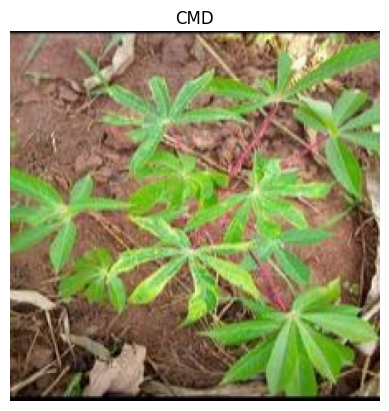

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# get one row
row = train_df.iloc[3]

# image path
image_path = os.path.join(TRAIN_DIR, row["ID"])

# label
label_id = row["Labels"]
label_name = label_map[str(label_id)]

# load image
img = Image.open(image_path)

# show image with ONLY class name
plt.imshow(img)
plt.title(label_name)
plt.axis("off")
plt.show()

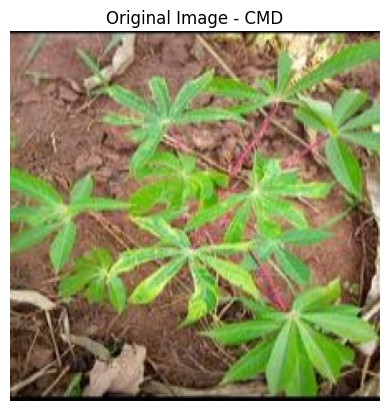

In [ ]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title(f"Original Image - {label_name}")
plt.axis("off")
plt.show()

Resize Image

In [ ]:
def show_image(title, image, cmap=None):
    plt.figure(figsize=(5,5))
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis("off")
    plt.show()

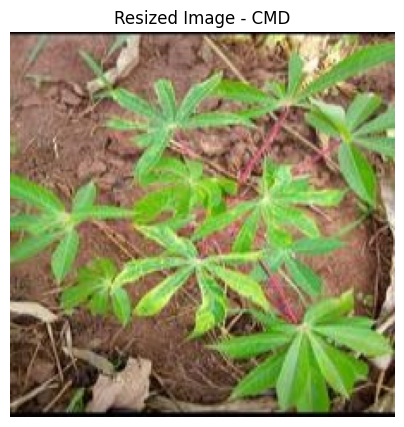

In [ ]:
resized = cv2.resize(img, (224, 224))
show_image(f"Resized Image - {label_name}", resized)

Grayscale

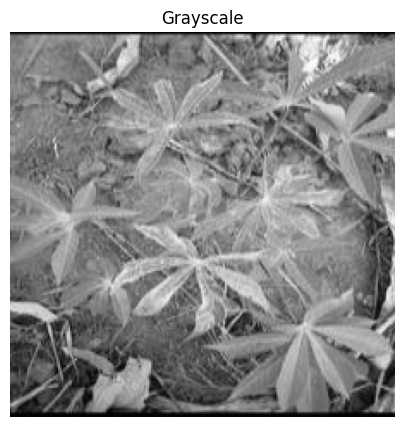

In [ ]:
gray = cv2.cvtColor(resized, cv2.COLOR_RGB2GRAY)
show_image("Grayscale", gray, cmap="gray")



Gaussian BLur

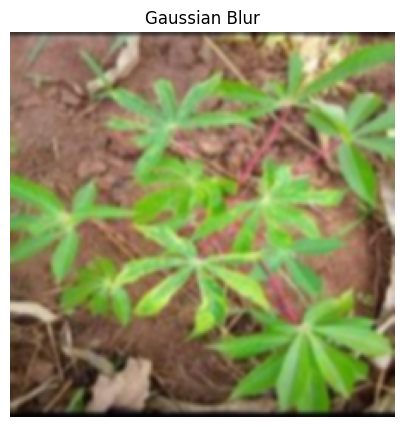

In [ ]:
gaussian_blur = cv2.GaussianBlur(resized, (5, 5), 0)
show_image("Gaussian Blur", gaussian_blur)

Median Blur

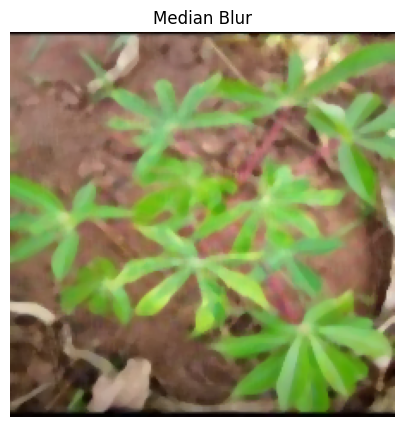

In [ ]:
median_blur = cv2.medianBlur(resized, 5)
show_image("Median Blur", median_blur)

Sharpening

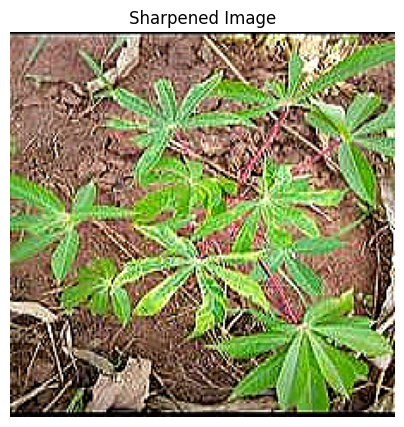

In [ ]:
sharpen_kernel = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
])

sharpened = cv2.filter2D(resized, -1, sharpen_kernel)
show_image("Sharpened Image", sharpened)

Histogram Equilization

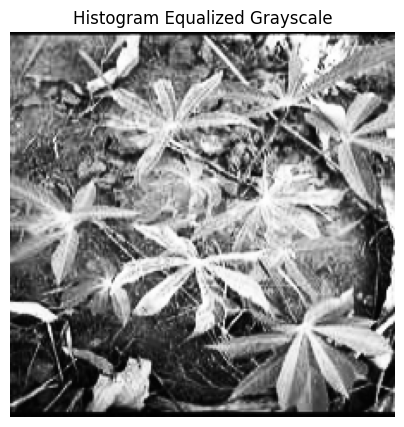

In [ ]:
gray_equalized = cv2.equalizeHist(gray)
show_image("Histogram Equalized Grayscale", gray_equalized, cmap="gray")

CLAHE enhancement

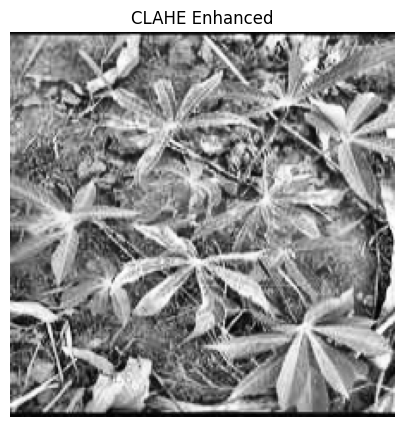

In [ ]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_img = clahe.apply(gray)

show_image("CLAHE Enhanced", clahe_img, cmap="gray")

Canny edge detection

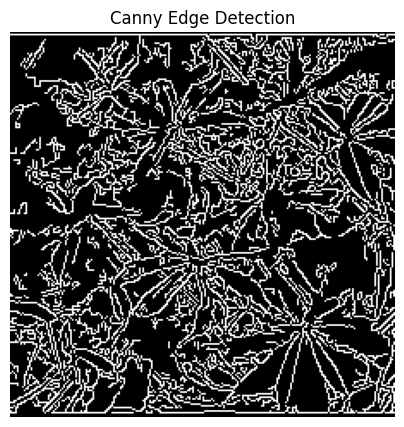

In [ ]:
edges = cv2.Canny(gray, 100, 200)
show_image("Canny Edge Detection", edges, cmap="gray")

Sobel edge detection

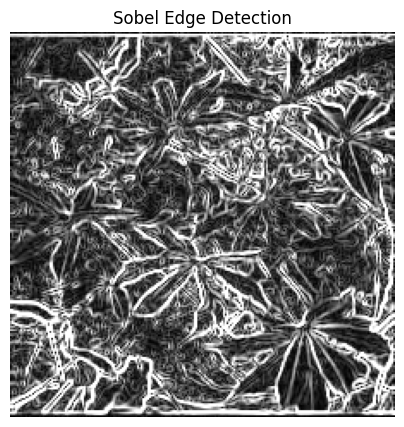

In [ ]:
sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)

sobel = cv2.magnitude(sobel_x, sobel_y)
sobel = np.uint8(np.clip(sobel, 0, 255))

show_image("Sobel Edge Detection", sobel, cmap="gray")




Thresholding

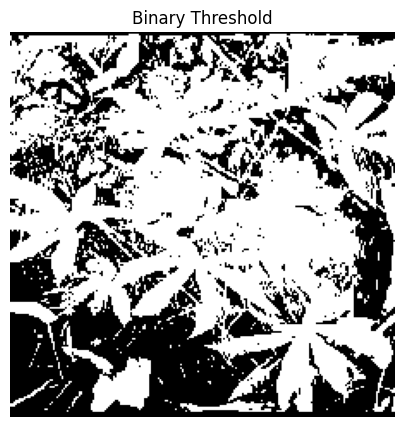

In [ ]:
_, threshold = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY)
show_image("Binary Threshold", threshold, cmap="gray")

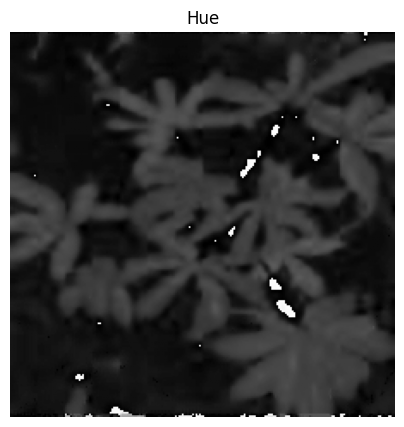

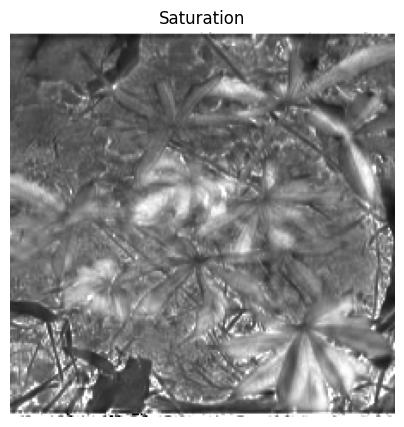

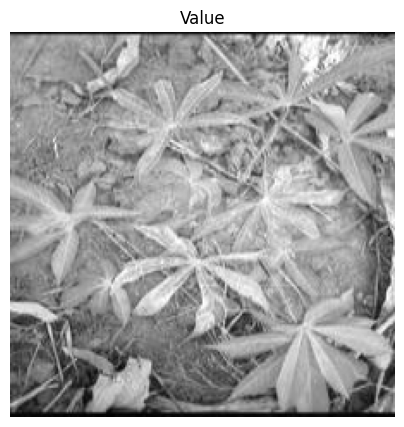

In [ ]:
hsv = cv2.cvtColor(resized, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv)

show_image("Hue", h, "gray")
show_image("Saturation", s, "gray")
show_image("Value", v, "gray")

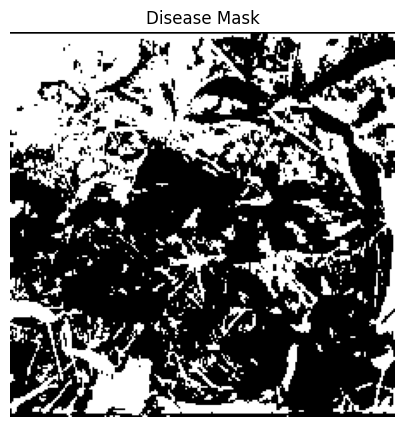

In [ ]:
_, mask = cv2.threshold(s, 100, 255, cv2.THRESH_BINARY_INV)
show_image("Disease Mask", mask, "gray")

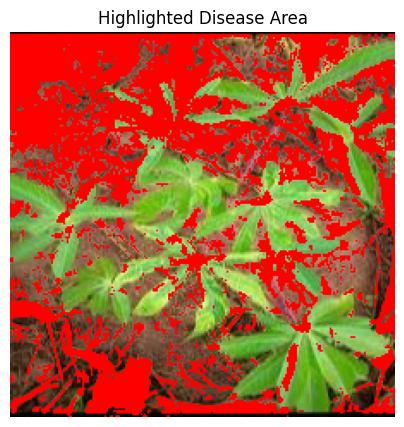

In [ ]:
highlight = resized.copy()
highlight[mask == 255] = [255, 0, 0]

show_image("Highlighted Disease Area", highlight)

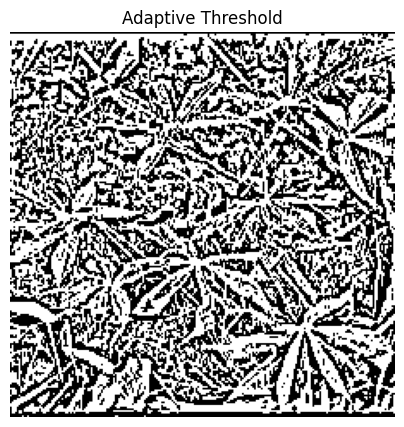

In [ ]:
adaptive_threshold = cv2.adaptiveThreshold(
    gray,
    255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY,
    11,
    2
)

show_image("Adaptive Threshold", adaptive_threshold, cmap="gray")

Morphological operations

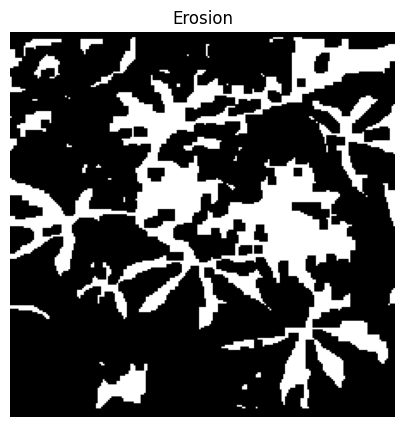

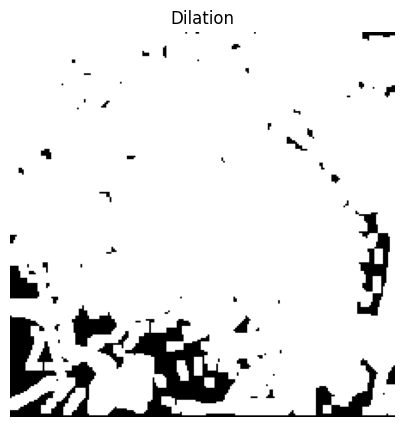

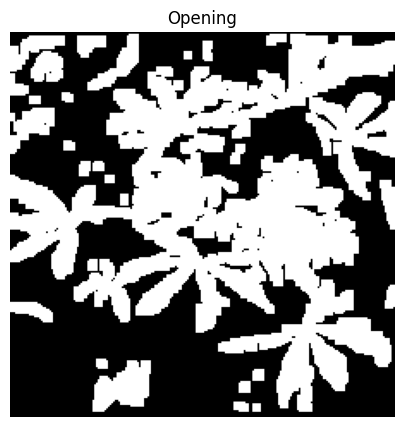

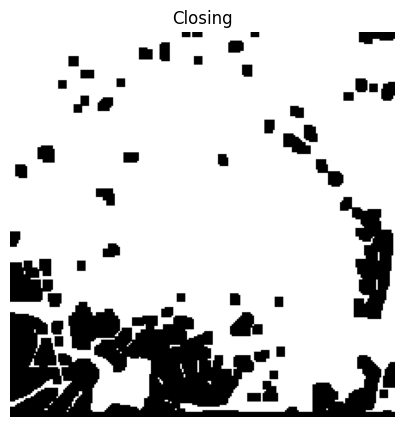

In [ ]:
kernel = np.ones((5,5), np.uint8)

erosion = cv2.erode(threshold, kernel, iterations=1)
dilation = cv2.dilate(threshold, kernel, iterations=1)
opening = cv2.morphologyEx(threshold, cv2.MORPH_OPEN, kernel)
closing = cv2.morphologyEx(threshold, cv2.MORPH_CLOSE, kernel)

show_image("Erosion", erosion, cmap="gray")
show_image("Dilation", dilation, cmap="gray")
show_image("Opening", opening, cmap="gray")
show_image("Closing", closing, cmap="gray")

HSV color space

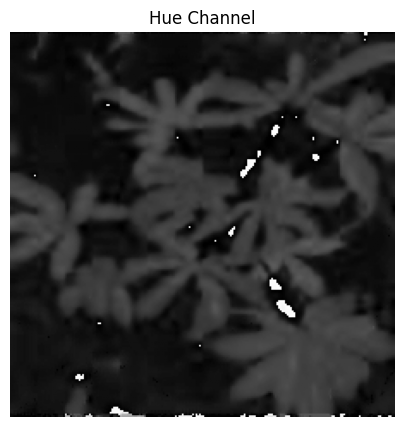

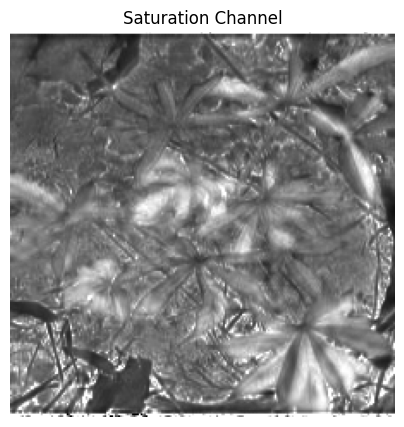

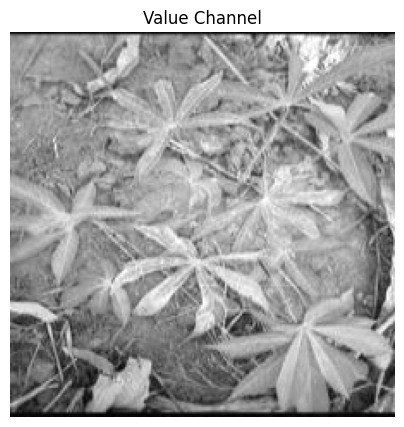

In [ ]:
hsv = cv2.cvtColor(resized, cv2.COLOR_RGB2HSV)

h, s, v = cv2.split(hsv)

show_image("Hue Channel", h, cmap="gray")
show_image("Saturation Channel", s, cmap="gray")
show_image("Value Channel", v, cmap="gray")

RGB histogram

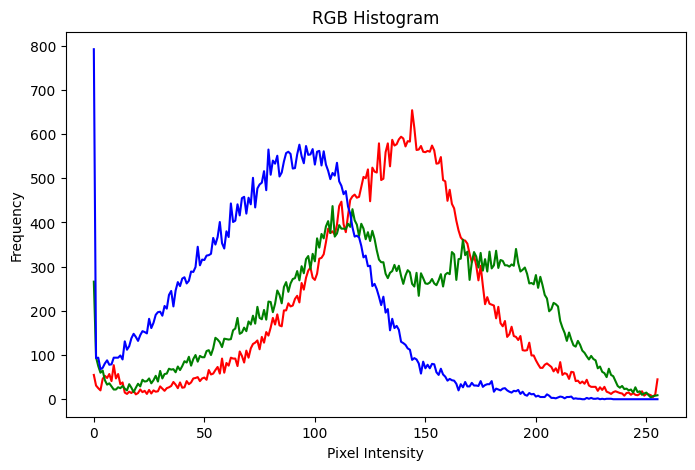

In [ ]:
colors = ("red", "green", "blue")

plt.figure(figsize=(8,5))

for i, color in enumerate(colors):
    hist = cv2.calcHist([resized], [i], None, [256], [0,256])
    plt.plot(hist, color=color)

plt.title("RGB Histogram")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()

Show everything in one grid

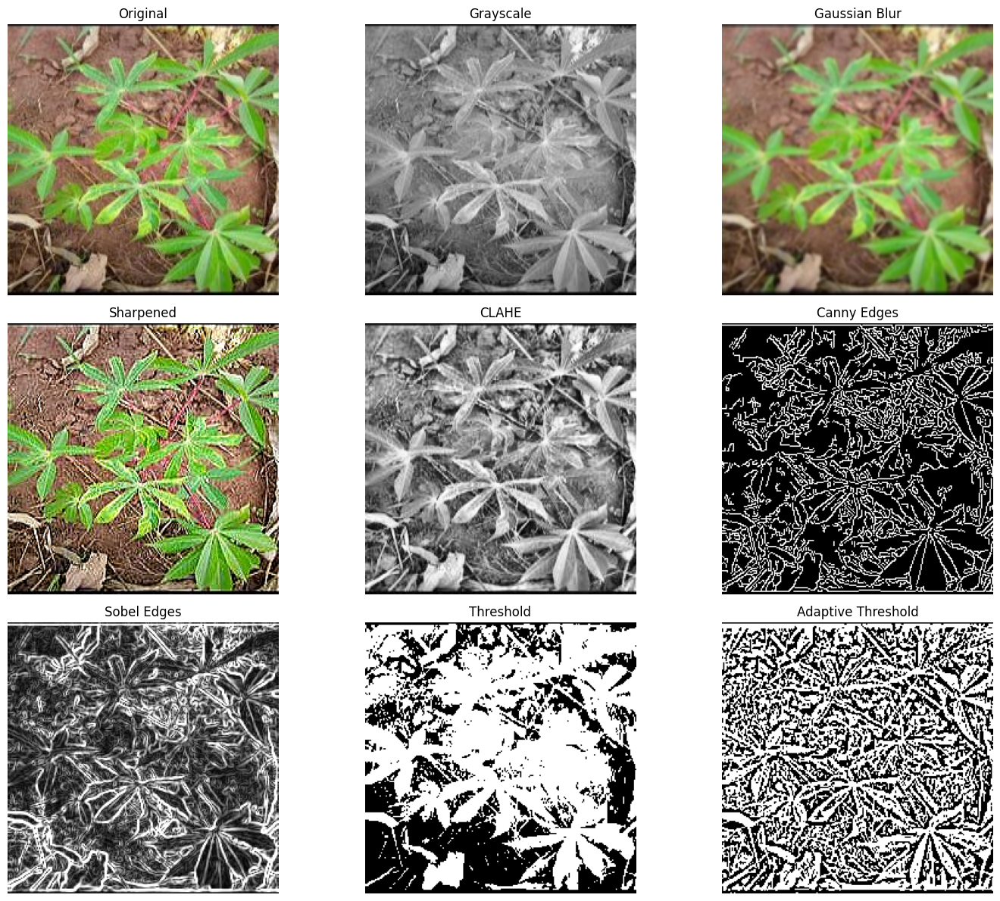

In [ ]:
images = [
    ("Original", resized, None),
    ("Grayscale", gray, "gray"),
    ("Gaussian Blur", gaussian_blur, None),
    ("Sharpened", sharpened, None),
    ("CLAHE", clahe_img, "gray"),
    ("Canny Edges", edges, "gray"),
    ("Sobel Edges", sobel, "gray"),
    ("Threshold", threshold, "gray"),
    ("Adaptive Threshold", adaptive_threshold, "gray")
]

plt.figure(figsize=(15, 12))

for i, (title, image, cmap) in enumerate(images):
    plt.subplot(3, 3, i + 1)
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis("off")

plt.tight_layout()
plt.show()

#Image Generator

In [ ]:
import tensorflow as tf
import pandas as pd
import numpy as np

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input

from tensorflow.keras.layers import (
    Dense,
    Dropout,
    GlobalAveragePooling2D,
    BatchNormalization
)

from tensorflow.keras.models import Model

from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

In [ ]:
train_dir = "/content/drive/MyDrive/dataset_sir/main_dataset/Train/Train_Images_clean"

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/dataset_sir/main_dataset/Train/Train.csv")

In [ ]:
train_df, val_df = train_test_split(

    df,

    test_size=0.2,

    random_state=42,

    stratify=df['Labels']
)

In [ ]:
print(train_df.head())
print(val_df.head())
print(test_df.head())

                  ID  Labels
3552  2616538732.jpg       1
1183  1536703688.jpg       2
3649    61357519.jpg       4
3597  4266856745.jpg       1
1882   186394398.jpg       0
                  ID  Labels
1327  4050718274.jpg       2
1040  4159778976.jpg       3
1920  2055911260.jpg       2
3212  3116498490.jpg       0
164   3854553332.jpg       4
               ID  Labels
0  2595356168.jpg       3
1   794817264.jpg       0
2  4270972443.jpg       4
3  3540803278.jpg       0
4  2142522228.jpg       3


In [ ]:
train_df['Labels'] = train_df['Labels'].astype(str)

val_df['Labels'] = val_df['Labels'].astype(str)

test_df['Labels'] = test_df['Labels'].astype(str)

In [ ]:
print(train_df.dtypes)
print(val_df.dtypes)
print(test_df.dtypes)

ID        object
Labels    object
dtype: object
ID        object
Labels    object
dtype: object
ID        object
Labels    object
dtype: object


#TRAIN GENERATOR

In [ ]:
train_data = train_datagen.flow_from_dataframe(

    dataframe=train_df,

    directory=train_dir,

    x_col='ID',

    y_col='Labels',

    target_size=(224,224),

    batch_size=16,

    class_mode='categorical',

    shuffle=True
)

Found 3200 validated image filenames belonging to 5 classes.


#VALIDATION GENERATOR

In [ ]:
val_data = val_datagen.flow_from_dataframe(

    dataframe=val_df,

    directory=train_dir,

    x_col='ID',

    y_col='Labels',

    target_size=(224,224),

    batch_size=16,

    class_mode='categorical',

    shuffle=False
)

Found 800 validated image filenames belonging to 5 classes.


In [ ]:
import os

print(os.listdir(train_dir)[:5])

['1000015157.jpg', '1001320321.jpg', '1002088496.jpg', '1000910826.jpg', '1002394761.jpg']


In [ ]:
sample_image = train_df.iloc[0]['ID']

image_path = os.path.join(train_dir, sample_image)

print(image_path)

print(os.path.exists(image_path))

/content/drive/MyDrive/dataset_sir/main_dataset/Train/Train_Images_clean/2616538732.jpg
True


#TEST GENERATOR

In [ ]:
print(test_df.head())

               ID Labels
0  2595356168.jpg      3
1   794817264.jpg      0
2  4270972443.jpg      4
3  3540803278.jpg      0
4  2142522228.jpg      3


In [ ]:
sample_test = test_df.iloc[0]['ID']

import os

print(sample_test)

print(os.path.join(train_dir, sample_test))

print(os.path.exists(os.path.join(train_dir, sample_test)))

2595356168.jpg
/content/drive/MyDrive/dataset_sir/main_dataset/Train/Train_Images_clean/2595356168.jpg
False


In [ ]:
test_data = val_datagen.flow_from_dataframe(

    dataframe=test_df,

    directory=test_dir,

    x_col='ID',

    y_col='Labels',

    target_size=(224,224),

    batch_size=16,

    class_mode='categorical',

    shuffle=False
)

Found 1000 validated image filenames belonging to 5 classes.


In [ ]:
NUM_CLASSES = len(train_data.class_indices)

print(NUM_CLASSES)
print(train_data.class_indices)

5
{'0': 0, '1': 1, '2': 2, '3': 3, '4': 4}


#EfficientNetB0

In [ ]:
from tensorflow.keras.applications import EfficientNetB0
base_model = EfficientNetB0(

    weights='imagenet',

    include_top=False,

    input_shape=(224,224,3)
)

In [ ]:
from tensorflow.keras.applications.efficientnet import preprocess_input

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

class_weights = compute_class_weight(

    class_weight='balanced',

    classes=np.unique(train_data.classes),

    y=train_data.classes
)

class_weights = dict(enumerate(class_weights))

print(class_weights)

{0: np.float64(1.0), 1: np.float64(1.0), 2: np.float64(1.0), 3: np.float64(1.0), 4: np.float64(1.0)}


In [ ]:
from tensorflow.keras.layers import (
    Dense,
    Dropout,
    GlobalAveragePooling2D,
    BatchNormalization
)

from tensorflow.keras.models import Model

x = base_model.output

x = GlobalAveragePooling2D()(x)

x = BatchNormalization()(x)

x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)

x = Dense(128, activation='relu')(x)
x = Dropout(0.3)(x)

output = Dense(5, activation='softmax')(x)

model = Model(
    inputs=base_model.input,
    outputs=output
)

In [ ]:
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

In [ ]:
early_stop = EarlyStopping(

    monitor='val_loss',

    patience=5,

    restore_best_weights=True
)

In [ ]:
reduce_lr = ReduceLROnPlateau(

    monitor='val_loss',

    factor=0.2,

    patience=2,

    min_lr=1e-6
)

In [ ]:
checkpoint = ModelCheckpoint(

    "best_efficientnetb0.keras",

    monitor='val_accuracy',

    save_best_only=True,

    verbose=1
)

In [ ]:
import tensorflow as tf

model.compile(

    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-3
    ),

    loss='categorical_crossentropy',

    metrics=['accuracy']
)

In [ ]:
history = model.fit(

    train_data,

    validation_data=val_data,

    epochs=10,

    class_weight=class_weights,

    callbacks=[
        early_stop,
        reduce_lr,
        checkpoint
    ]
)

Epoch 1/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step - accuracy: 0.3566 - loss: 1.9743
Epoch 1: val_accuracy improved from None to 0.44250, saving model to best_efficientnetb0.keras

Epoch 1: finished saving model to best_efficientnetb0.keras
200/200 ━━━━━━━━━━━━━━━━━━━━ 151s 375ms/step - accuracy: 0.3759 - loss: 1.7980 - val_accuracy: 0.4425 - val_loss: 1.3898 - learning_rate: 0.0010
Epoch 2/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step - accuracy: 0.4917 - loss: 1.3233
Epoch 2: val_accuracy improved from 0.44250 to 0.59250, saving model to best_efficientnetb0.keras

Epoch 2: finished saving model to best_efficientnetb0.keras
200/200 ━━━━━━━━━━━━━━━━━━━━ 68s 341ms/step - accuracy: 0.4956 - loss: 1.3104 - val_accuracy: 0.5925 - val_loss: 1.0729 - learning_rate: 0.0010
Epoch 3/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step - accuracy: 0.5340 - loss: 1.1896
Epoch 3: val_accuracy did not improve from 0.59250
200/200 ━━━━━━━━━━━━━━━━━━━━ 74s 371ms/step - accuracy: 0.5575 - loss: 1.1656 - v

In [ ]:
# Removed !pip install keras-shufflenet-v2 as it seems unavailable or problematic

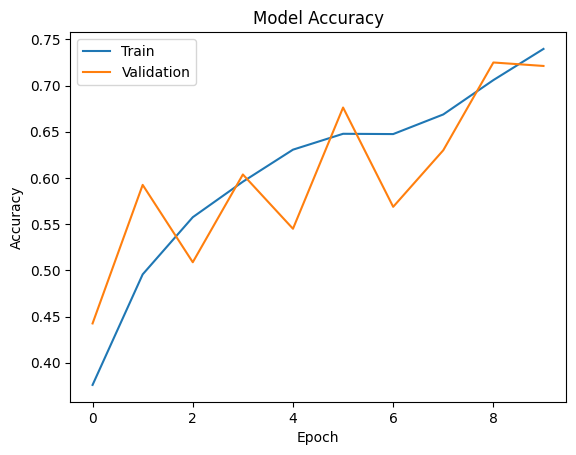

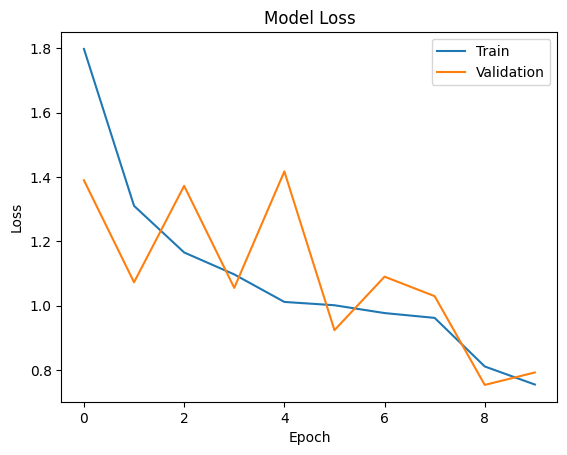

In [ ]:
import matplotlib.pyplot as plt

# Accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])
plt.show()

# Loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])
plt.show()

In [ ]:
loss, acc = model.evaluate(test_data)
print("Test Accuracy:", acc)

63/63 ━━━━━━━━━━━━━━━━━━━━ 16s 251ms/step - accuracy: 0.7200 - loss: 0.7465
Test Accuracy: 0.7200000286102295


In [ ]:
for layer in model.layers[-20:]:
    layer.trainable = True

In [ ]:
for layer in model.layers[:-20]:
    layer.trainable = False

In [ ]:
model.compile(

    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-5
    ),

    loss='categorical_crossentropy',

    metrics=['accuracy']
)

In [ ]:
history_fine = model.fit(

    train_data,

    validation_data=val_data,

    epochs=10,

    class_weight=class_weights,

    callbacks=[
        early_stop,
        reduce_lr,
        checkpoint
    ]
)

Epoch 1/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step - accuracy: 0.7612 - loss: 0.6776
Epoch 1: val_accuracy improved from 0.72500 to 0.72875, saving model to best_efficientnetb0.keras

Epoch 1: finished saving model to best_efficientnetb0.keras
200/200 ━━━━━━━━━━━━━━━━━━━━ 94s 364ms/step - accuracy: 0.7675 - loss: 0.6746 - val_accuracy: 0.7287 - val_loss: 0.7518 - learning_rate: 1.0000e-05
Epoch 2/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.7581 - loss: 0.6885
Epoch 2: val_accuracy improved from 0.72875 to 0.73125, saving model to best_efficientnetb0.keras

Epoch 2: finished saving model to best_efficientnetb0.keras
200/200 ━━━━━━━━━━━━━━━━━━━━ 63s 314ms/step - accuracy: 0.7566 - loss: 0.6918 - val_accuracy: 0.7312 - val_loss: 0.7498 - learning_rate: 1.0000e-05
Epoch 3/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step - accuracy: 0.7676 - loss: 0.6776
Epoch 3: val_accuracy did not improve from 0.73125
200/200 ━━━━━━━━━━━━━━━━━━━━ 62s 309ms/step - accuracy: 0.7622 - loss: 

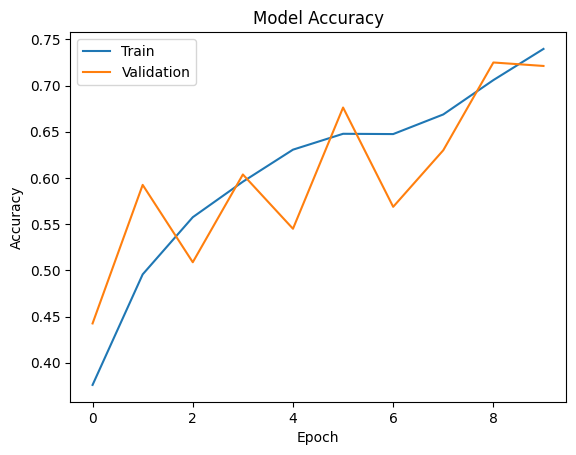

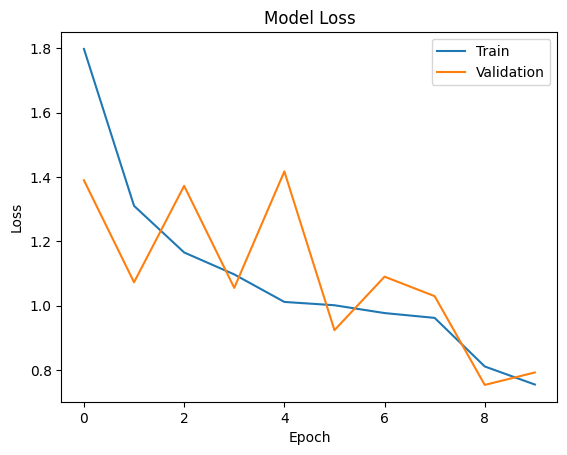

In [ ]:
import matplotlib.pyplot as plt

# Accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])
plt.show()

# Loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])
plt.show()

In [ ]:
test_loss, test_accuracy = model.evaluate(test_data)

print("Test Accuracy:", test_accuracy)

63/63 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - accuracy: 0.7320 - loss: 0.7390
Test Accuracy: 0.7319999933242798


In [ ]:
model.save("cassava_EfficientNetB0_model.keras")

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

y_true = test_data.classes
y_pred = model.predict(test_data)
y_pred = np.argmax(y_pred, axis=1)

print(confusion_matrix(y_true, y_pred))
print(classification_report(y_true, y_pred))

63/63 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step
[[163  10   1   4  22]
 [ 27 135   7  12  19]
 [  8   9 153  16  14]
 [  1   5  24 164   6]
 [ 43  18  14   8 117]]
              precision    recall  f1-score   support

           0       0.67      0.81      0.74       200
           1       0.76      0.68      0.72       200
           2       0.77      0.77      0.77       200
           3       0.80      0.82      0.81       200
           4       0.66      0.58      0.62       200

    accuracy                           0.73      1000
   macro avg       0.73      0.73      0.73      1000
weighted avg       0.73      0.73      0.73      1000



In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8,6))

sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues'
)

plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

### 🎯 1. Predict on a SINGLE image

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Load class names
class_names = list(train_data.class_indices.keys())

def predict_single_image(img_path, model):
    # Load image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Resize
    img_resized = cv2.resize(img, (224, 224))

    # Normalize
    img_norm = img_resized / 255.0

    # Expand dims
    img_input = np.expand_dims(img_norm, axis=0)

    # Predict
    pred = model.predict(img_input)
    pred_class = np.argmax(pred)
    confidence = np.max(pred)

    # Show result
    plt.imshow(img)
    plt.title(f"Predicted: {class_names[pred_class]} ({confidence:.2f})")
    plt.axis('off')
    plt.show()

    return class_names[pred_class], confidence

In [ ]:
import os
print(os.path.exists(img_path))

True


In [ ]:
import os

test_folder = '/content/drive/MyDrive/dataset_sir/main_dataset/Test/Test_images_clean'
print(os.listdir(test_folder)[:10])

['952111080.jpg', '953844785.jpg', '951326010.jpg', '955794248.jpg', '961575661.jpg', '962558857.jpg', '965133347.jpg', '967123833.jpg', '969069572.jpg', '969211018.jpg']


In [ ]:
def predict_single_image(img_path, model):
    import cv2
    import numpy as np
    import matplotlib.pyplot as plt

    # Check file exists
    import os
    if not os.path.exists(img_path):
        print("❌ File not found:", img_path)
        return

    # Load image
    img = cv2.imread(img_path)

    if img is None:
        print("❌ Failed to load image (corrupted or wrong format)")
        return

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img_resized = cv2.resize(img, (224, 224))
    img_norm = img_resized / 255.0
    img_input = np.expand_dims(img_norm, axis=0)

    pred = model.predict(img_input)
    pred_class = np.argmax(pred)
    confidence = np.max(pred)

    plt.imshow(img)
    plt.title(f"Predicted: {class_names[pred_class]} ({confidence:.2f})")
    plt.axis('off')
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step


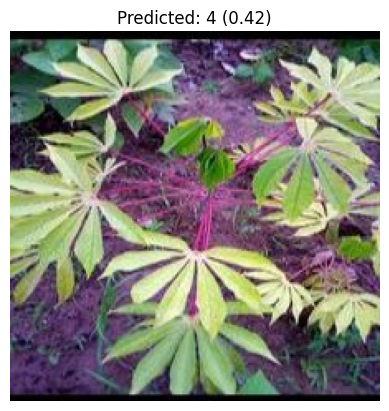

In [ ]:
import os

test_folder = '/content/drive/MyDrive/dataset_sir/main_dataset/Test/Test_images_clean'
img_name = os.listdir(test_folder)[0]

img_path = os.path.join(test_folder, img_name)

predict_single_image(img_path, model)

#🔥 2. Predict on MULTIPLE images

In [ ]:
class_names = list(train_data.class_indices.keys())

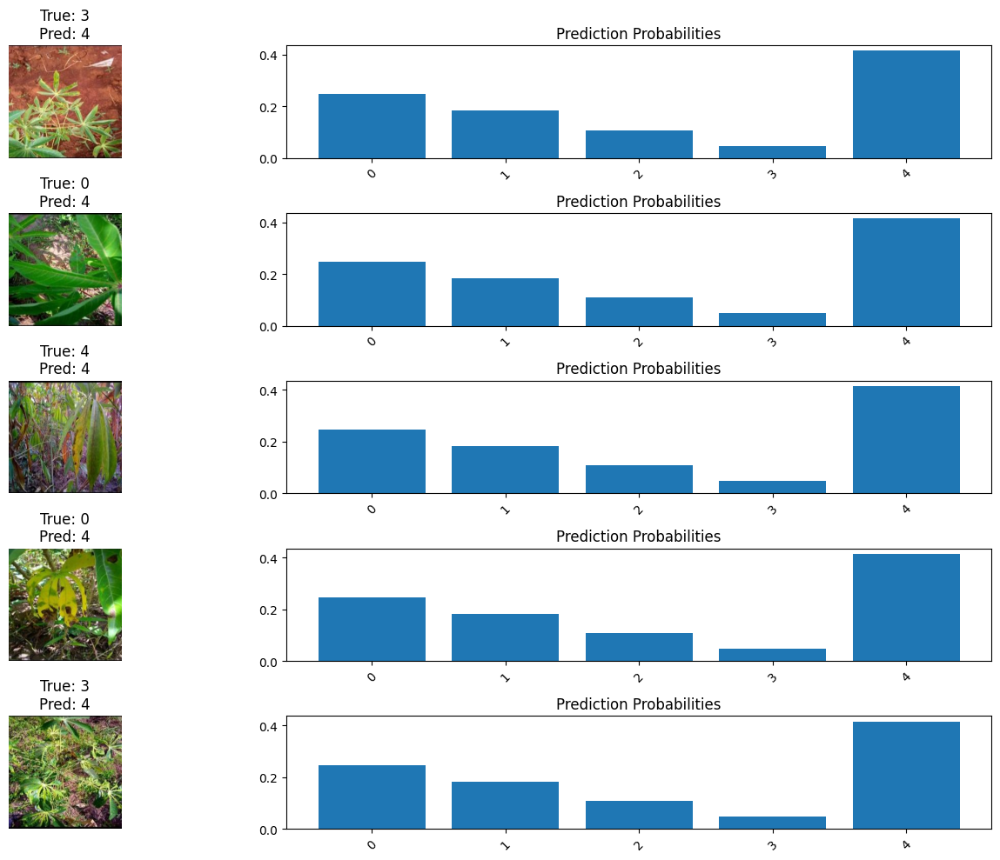

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

test_folder = '/content/drive/MyDrive/dataset_sir/main_dataset/Test/Test_images_clean'

# get filenames + true labels from generator
filenames = test_data.filenames
true_labels = test_data.classes

# number of images to display
num_images = 5

plt.figure(figsize=(15, 10))

for i in range(num_images):
    img_name = filenames[i]
    img_path = os.path.join(test_folder, img_name)

    # Load image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Preprocess
    img_resized = cv2.resize(img, (224, 224))
    img_norm = img_resized / 255.0
    img_input = np.expand_dims(img_norm, axis=0)

    # Predict
    preds = model.predict(img_input, verbose=0)[0]
    pred_class = np.argmax(preds)

    # ---- IMAGE ----
    plt.subplot(num_images, 2, 2*i+1)
    plt.imshow(img)
    plt.title(f"True: {class_names[true_labels[i]]}\nPred: {class_names[pred_class]}")
    plt.axis('off')

    # ---- BAR CHART ----
    plt.subplot(num_images, 2, 2*i+2)
    plt.bar(class_names, preds)
    plt.title("Prediction Probabilities")
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

#🎯 Top-3 predictions visualization

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

class_names = list(train_data.class_indices.keys())

def predict_top3(img_path, model):
    # Load image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Preprocess
    img_resized = cv2.resize(img, (224, 224))
    img_norm = img_resized / 255.0
    img_input = np.expand_dims(img_norm, axis=0)

    # Predict
    preds = model.predict(img_input, verbose=0)[0]

    # Top 3 indices
    top3_idx = preds.argsort()[-3:][::-1]

    # ---- Display ----
    plt.figure(figsize=(10,4))

    # Image
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title("Input Image")
    plt.axis('off')

    # Bar chart
    plt.subplot(1,2,2)
    top3_labels = [class_names[i] for i in top3_idx]
    top3_probs = preds[top3_idx]

    plt.bar(top3_labels, top3_probs)
    plt.title("Top-3 Predictions")
    plt.ylim(0,1)

    for i, v in enumerate(top3_probs):
        plt.text(i, v + 0.02, f"{v:.2f}", ha='center')

    plt.show()

    return list(zip(top3_labels, top3_probs))

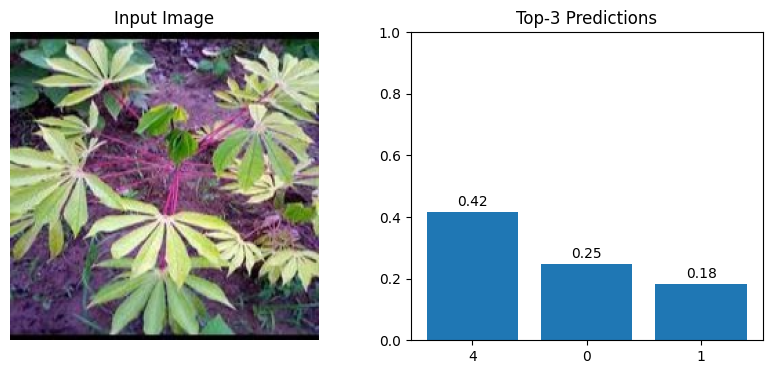

[('4', np.float32(0.41513607)),
 ('0', np.float32(0.24633431)),
 ('1', np.float32(0.1833724))]

In [ ]:
import os

test_folder = '/content/drive/MyDrive/dataset_sir/main_dataset/Test/Test_images_clean'
img_name = os.listdir(test_folder)[0]

img_path = os.path.join(test_folder, img_name)

predict_top3(img_path, model)

Image: 952111080.jpg


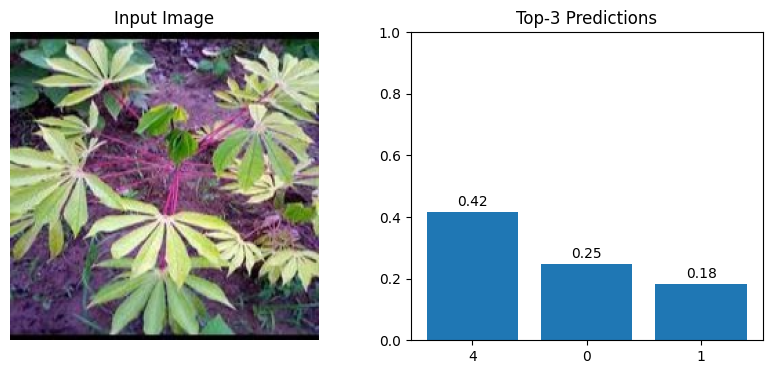

[('4', np.float32(0.41513607)), ('0', np.float32(0.24633431)), ('1', np.float32(0.1833724))]
----------------------------------------
Image: 953844785.jpg


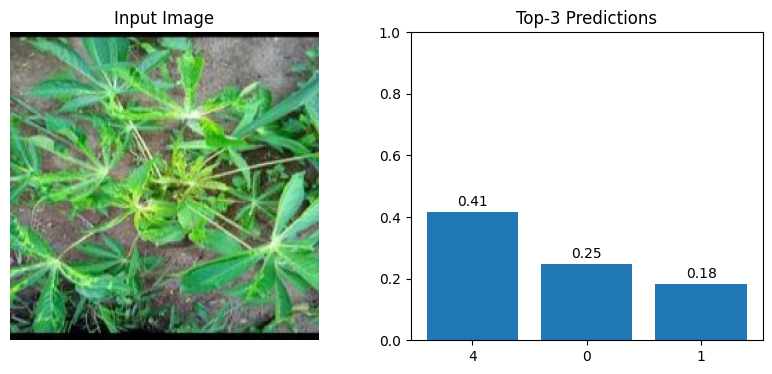

[('4', np.float32(0.41496512)), ('0', np.float32(0.24638855)), ('1', np.float32(0.18329278))]
----------------------------------------
Image: 951326010.jpg


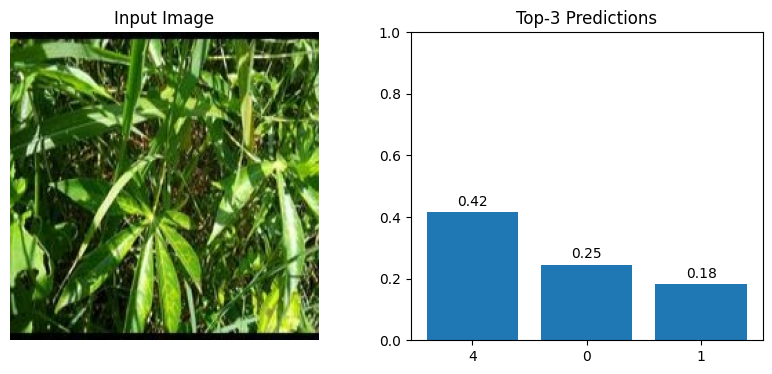

[('4', np.float32(0.41539517)), ('0', np.float32(0.2457256)), ('1', np.float32(0.18319711))]
----------------------------------------
Image: 955794248.jpg


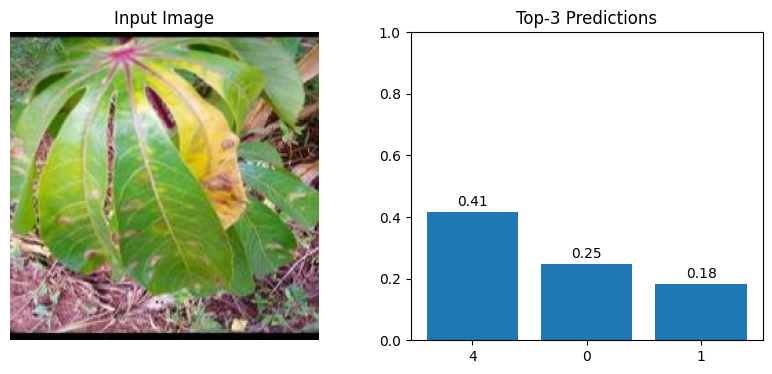

[('4', np.float32(0.41493484)), ('0', np.float32(0.2467633)), ('1', np.float32(0.18330745))]
----------------------------------------
Image: 961575661.jpg


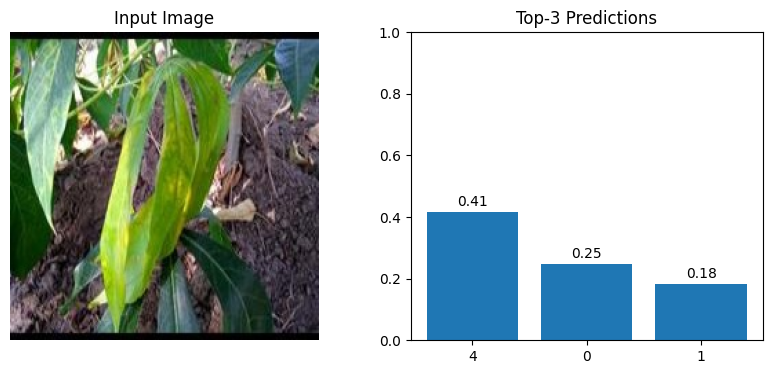

[('4', np.float32(0.4149561)), ('0', np.float32(0.24627484)), ('1', np.float32(0.18334085))]
----------------------------------------


In [ ]:
import os

test_folder = '/content/drive/MyDrive/dataset_sir/main_dataset/Test/Test_images_clean'

for img_name in os.listdir(test_folder)[:5]:
    img_path = os.path.join(test_folder, img_name)
    print("Image:", img_name)
    print(predict_top3(img_path, model))
    print("-"*40)

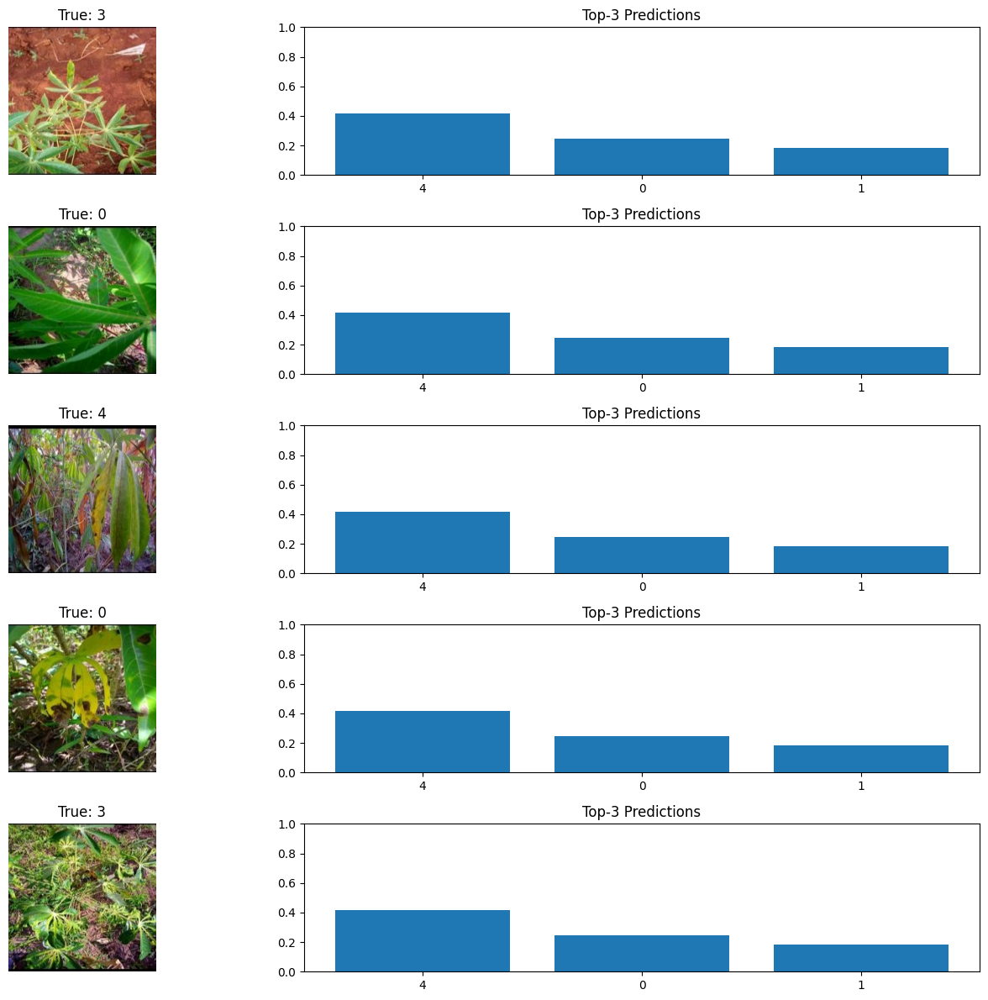

In [ ]:
import matplotlib.pyplot as plt

filenames = test_data.filenames
true_labels = test_data.classes

plt.figure(figsize=(15, 12))

for i in range(5):
    img_path = os.path.join(test_folder, filenames[i])

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img_resized = cv2.resize(img, (224, 224)) / 255.0
    img_input = np.expand_dims(img_resized, axis=0)

    preds = model.predict(img_input, verbose=0)[0]

    top3_idx = preds.argsort()[-3:][::-1]

    # Image
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(img)
    plt.title(f"True: {class_names[true_labels[i]]}")
    plt.axis('off')

    # Top-3 bar
    plt.subplot(5, 2, 2*i+2)
    labels = [class_names[j] for j in top3_idx]
    probs = preds[top3_idx]

    plt.bar(labels, probs)
    plt.title("Top-3 Predictions")
    plt.ylim(0,1)

plt.tight_layout()
plt.show()

In [ ]:
wrong_idx = np.where(np.argmax(model.predict(test_data), axis=1) != true_labels)[0]

for i in wrong_idx[:5]:
    print("Index:", i)

63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step
Index: 0
Index: 1
Index: 2
Index: 5
Index: 9


#📊 1. Confusion Matrix Heatmap (clean + visual)

63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step


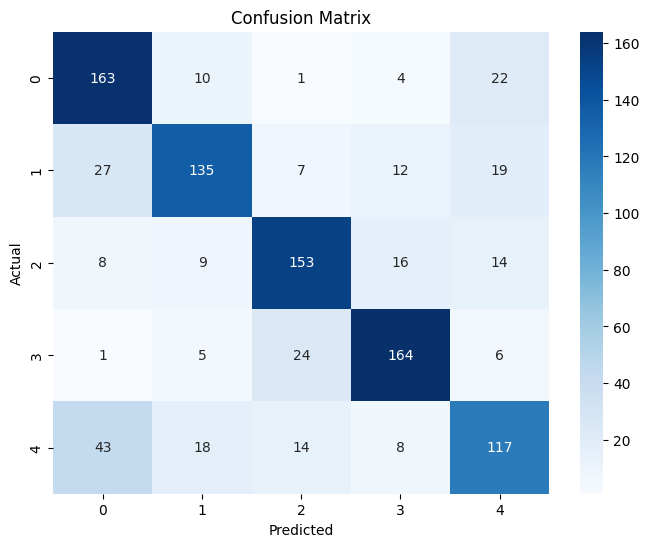

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Predictions
y_pred = model.predict(test_data)
y_pred_classes = np.argmax(y_pred, axis=1)

# True labels
y_true = test_data.classes

# Class names
class_names = list(train_data.class_indices.keys())

# Confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names,
            yticklabels=class_names)

plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
import os
import cv2

# Get filenames
filenames = test_data.filenames

# Find wrong predictions
wrong_idx = np.where(y_pred_classes != y_true)[0]

print("Total misclassified:", len(wrong_idx))

Total misclassified: 268
